In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.6/612.6 kB 24.8 MB/s eta 0:00:00


In [1]:
import ultralytics as ul
from ultralytics import YOLO as yl

In [3]:
ul.checks()

Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.2/78.2 GB disk)


In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="kOsHQhXjfibkaxKNz7Kg")
project = rf.workspace("z-im-8uw9v").project("face-shape-dxwly")
dataset = project.version(1).download("yolov8")



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.6/55.6 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 9.1 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=ffd7364e1e5a5710db2ca9793433b250bd26141e244bdf02ed0901ead3dea1b4
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.0
    Uninstalling pyparsing-3.1.0:
      Successfully uninstalled pyparsing-3.1.0
  Attempting uninstall: idna
    Found 

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics<=8.0.20 is required but found version=8.0.124, to fix: `pip install ultralytics<=8.0.20`


Extracting Dataset Version Zip to face-shape-1 in yolov8:: 100%|██████████| 2870/2870 [00:00<00:00, 3209.97it/s]


In [6]:
model = yl('/content/yolov8s.pt')  # load a pretrained YOLOv8n segmentation model
model.train(data='/content/face-shape-1/data.yaml', epochs=100)  # train the model

Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=/content/yolov8s.pt, data=/content/face-shape-1/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8

In [9]:
import pandas as pd

df = pd.read_csv('../project-data/shape_results/results.csv')
df.head()

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,0,1.08830,2.2318,1.5520,0.52468,0.56303,0.34925,0.22801,1.15760,1.8753,2.0116,0.000411,0.000411,0.000411
1,1,1.00640,1.5205,1.4119,0.25409,0.77280,0.31635,0.19838,1.19380,1.6882,1.8637,0.000819,0.000819,0.000819
2,2,1.01520,1.4445,1.4111,0.17464,0.68212,0.31001,0.18300,1.29270,1.7426,1.9439,0.001220,0.001220,0.001220
3,3,1.00010,1.4236,1.4030,0.24176,0.73375,0.33802,0.21503,1.13490,1.7807,1.7771,0.001213,0.001213,0.001213
4,4,0.98541,1.3751,1.3967,0.50485,0.64339,0.36158,0.26196,0.97734,1.3249,1.6368,0.001213,0.001213,0.001213


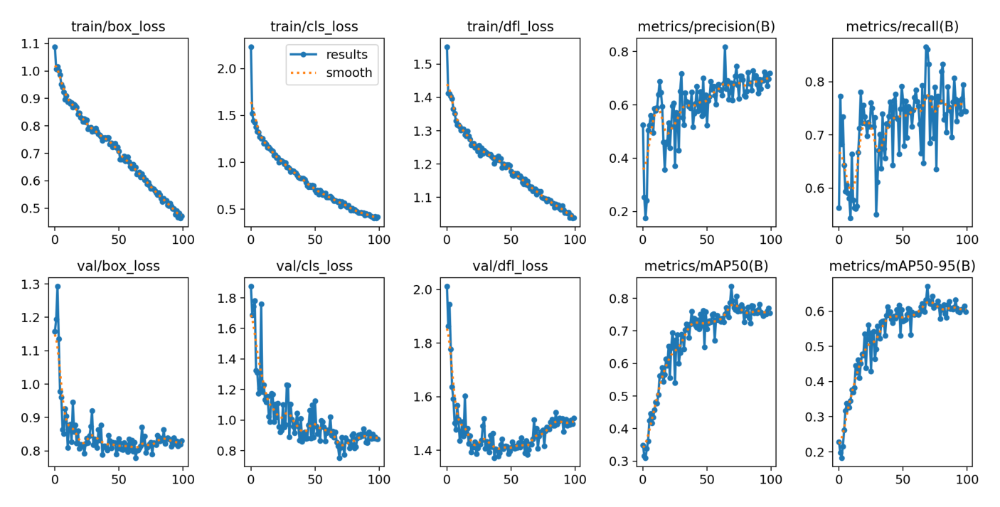

In [17]:
import matplotlib.pyplot as plt
from PIL import Image


image_path = '../project-data/shape_results/results.png'

width = 18
height = 9

image = Image.open(image_path)

fig, ax = plt.subplots(figsize=(width, height))

ax.imshow(image)

ax.axis('off')

plt.show()



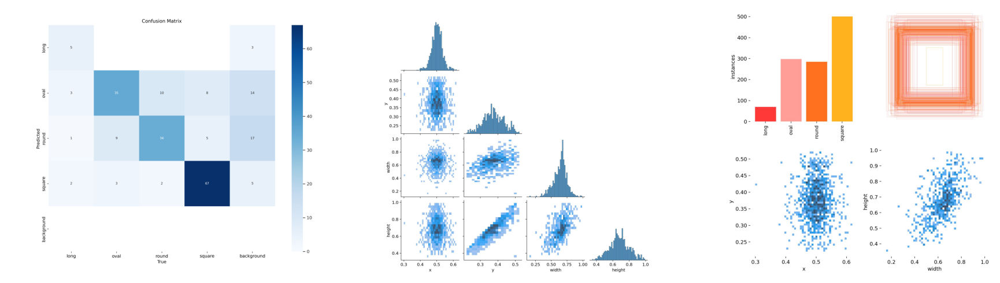

In [11]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image_paths = ['../project-data/shape_results/confusion_matrix.png', '../project-data/shape_results/labels_correlogram.jpg', '../project-data/shape_results/labels.jpg']

image_width = 6  
image_height = 5  

num_images = len(image_paths)
num_cols = 3  
num_rows = (num_images + num_cols - 1) // num_cols  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * image_width, num_rows * image_height))

for i, ax in enumerate(axes.flat):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.axis('off')  

plt.tight_layout()

plt.show()

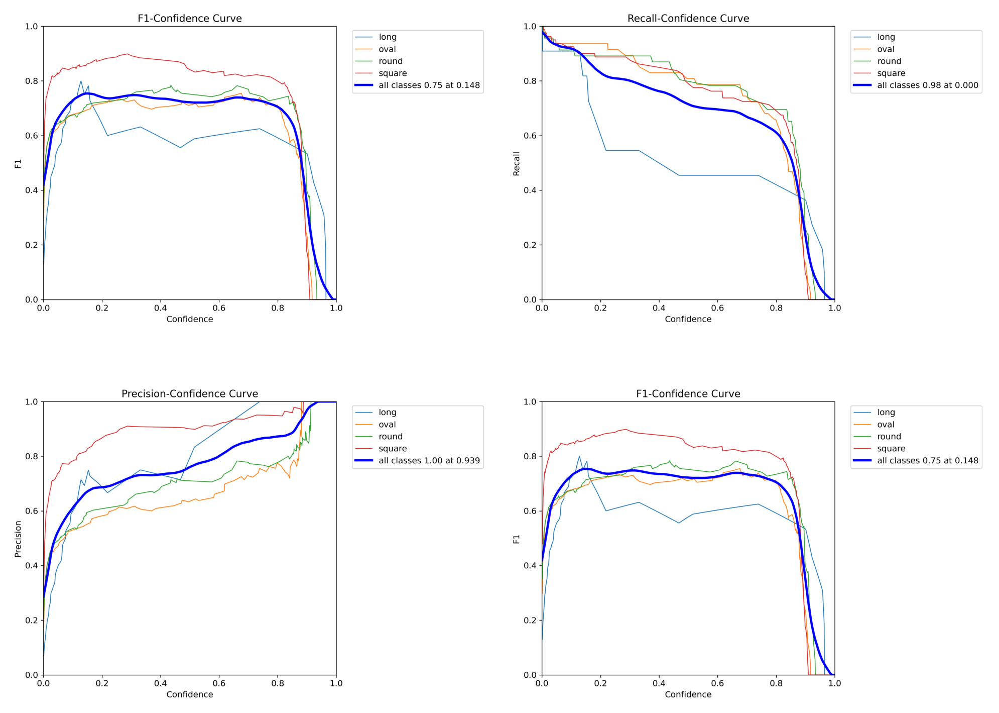

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_paths = ['../project-data/shape_results/F1_curve.png', '../project-data/shape_results/R_curve.png', '../project-data/shape_results/P_curve.png', '../project-data/shape_results/F1_curve.png']

image_width = 10  
image_height = 8  

num_images = len(image_paths)
num_cols = 2  
num_rows = (num_images + num_cols - 1) // num_cols  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * image_width, num_rows * image_height))

for i, ax in enumerate(axes.flat):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.axis('off')  

plt.tight_layout()

plt.show()


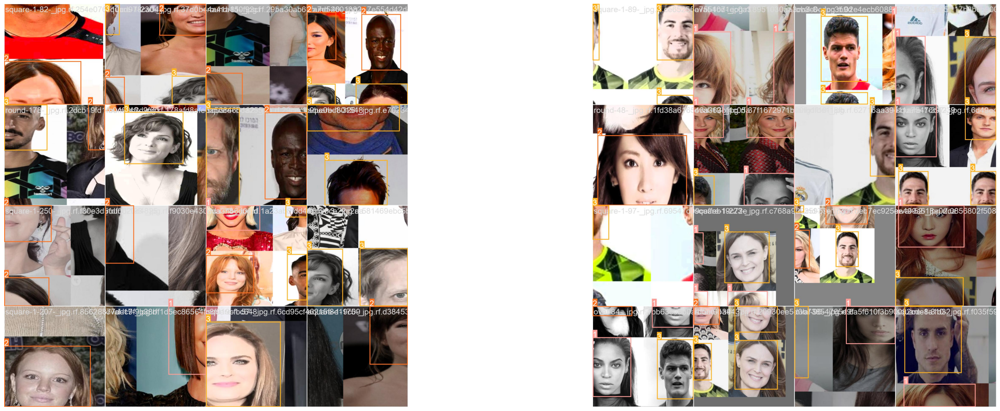

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image_paths = ['../project-data/shape_results/train_batch2.jpg', '../project-data/shape_results/train_batch1.jpg']

image_width = 16  
image_height = 10  

num_images = len(image_paths)
num_cols = 2  
num_rows = (num_images + num_cols - 1) // num_cols  
fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * image_width, num_rows * image_height))

for i, ax in enumerate(axes.flat):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.axis('off')  
plt.tight_layout()

plt.show()

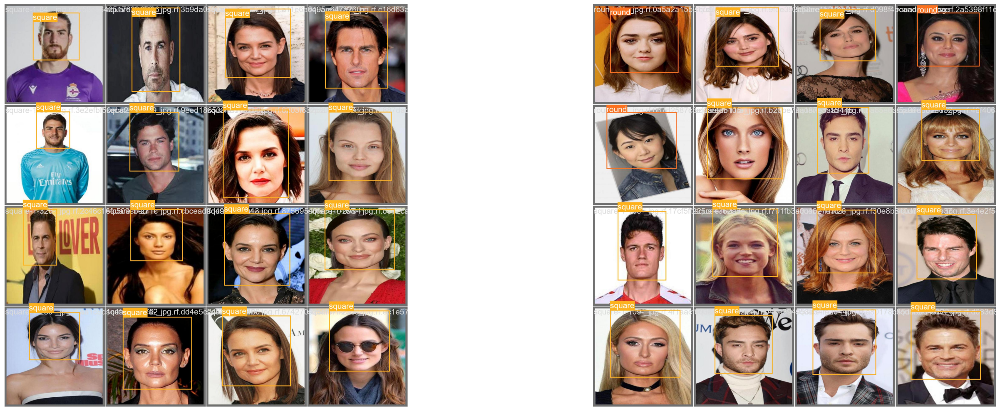

In [7]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image_paths = ['../project-data/shape_results/val_batch2_labels.jpg', '../project-data/shape_results/val_batch1_labels.jpg']

image_width = 16  
image_height = 10  

num_images = len(image_paths)
num_cols = 2 
num_rows = (num_images + num_cols - 1) // num_cols  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * image_width, num_rows * image_height))

for i, ax in enumerate(axes.flat):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.axis('off')  

plt.tight_layout()

plt.show()

In [11]:
shape_model = yl("./utils/yolo8n-shapes.pt")
shape_model.predict(source = "./utils/img.jpg")
shape_model


image 1/1 c:\Users\Red\code\project\hair-model\utils\img.jpg: 384x640 1 oval, 854.1ms
Speed: 16.0ms preprocess, 854.1ms inference, 37.4ms postprocess per image at shape (1, 3, 640, 640)


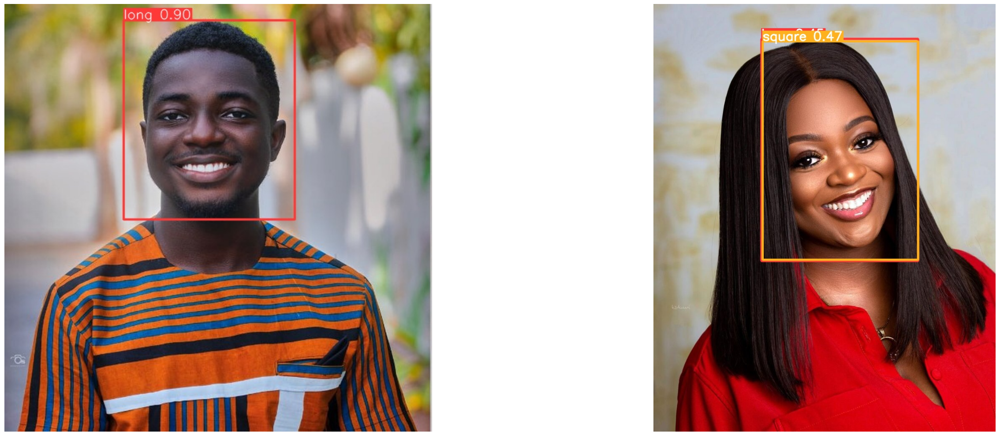

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image_paths = ['./utils/img1.jpg', './utils/11.jpeg', './utils/11.jpg']

image_width = 16  
image_height = 10  

num_images = len(image_paths)
num_cols = 3 
num_rows = (num_images + num_cols - 1) // num_cols  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * image_width, num_rows * image_height))

for i, ax in enumerate(axes.flat):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.axis('off')  

plt.tight_layout()

plt.show()